# Particle Trapping with Muon decay

Notes:
- Simulation is a two stage deal:
    - Generate muons isotropically within the DS trap region, allow them to propigate for 700 ns (no decay)
    - Use that output to further evolve remaining muons, allowing them to decay to electrons
- Their are two copies of each 2nd stage muon in `ntpart`.
    - Looks like copy 1 has t==0, p==100, pstop=p at 700ns
    - The second muon has t=~700, p==100, parent_pstop = original p_stop
- No muons have an initial timestamp > 700 ns
- No electrons are born before 700 ns


### Some Findings

Number of trapped muons per init muon p:
* p=80 : 22317*100 = ~2.2mil
* p=100: 30241*100 = ~3mil
* p=110: 34999*100 = ~3.5mil
* p=140: 19031*100 = ~1.9mil

Number of unique events in which an electron with p>100 makes it farther upstream than 11200mm:
* Muon init p=80: 0 Events
* Muon init p=100: 2 Events
* Muon init p=110: 5 Events
* Muon init p=140: 21 Events

In [1]:
from mu2e import mu2e_ext_path
from mu2e.dataframeprod import g4root_to_df
from root_pandas import read_root
import pandas as pd
from mu2e.mu2eplots import mu2e_plot3d_ptrap
from mu2e.mu2eplots import mu2e_plot3d_ptrap_traj
from mu2e.mu2eplots import mu2e_plot3d_ptrap_anim
import cPickle as pkl
%matplotlib inline
plt.rcParams['figure.figsize'] = (12,8)

Welcome to JupyROOT 6.08/02


/usr/local/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning:

The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.

/usr/local/lib/python2.7/site-packages/IPython/utils/traitlets.py:5: UserWarning:

IPython.utils.traitlets has moved to a top-level traitlets package.



<IPython.core.display.Javascript object>

In [2]:
pd.options.display.max_columns = 50

In [3]:
input_root_skim = mu2e_ext_path+'datafiles/G4ParticleSim/stage2_110p/iso_muons_GA05_stage2_vd_combo_skim.root'
df_ntpart = read_root(input_root_skim, 'ntpart')
df_nttvd = read_root(input_root_skim, 'nttvd')
df_ntvd = read_root(input_root_skim, 'ntvd')

In [6]:
input_root_single = mu2e_ext_path+'datafiles/G4ParticleSim/stage2_140p/iso_muons_GA05_stage2_vd0.root'
df_ntpart = read_root(input_root_single, 'readvd/ntpart')

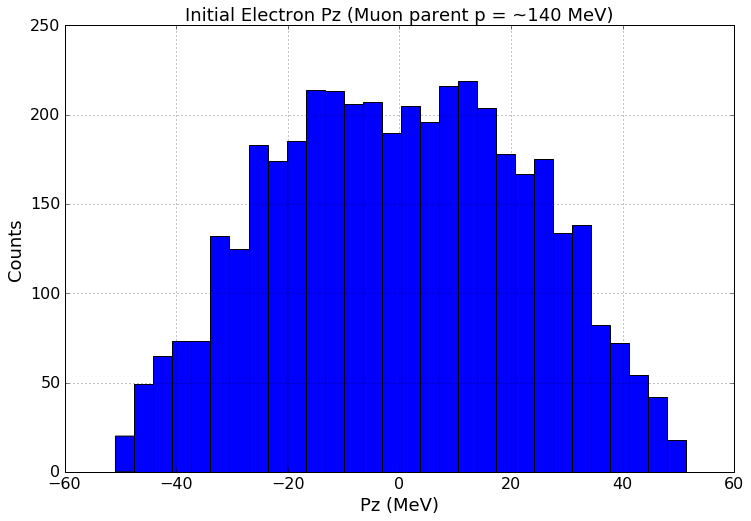

In [21]:
df_ntpart.query('pdg==11 and parent_pdg==13').pz.hist(bins=30)
plt.title('Initial Electron Pz (Muon parent p = ~140 MeV)')
plt.ylabel('Counts')
plt.xlabel('Pz (MeV)')

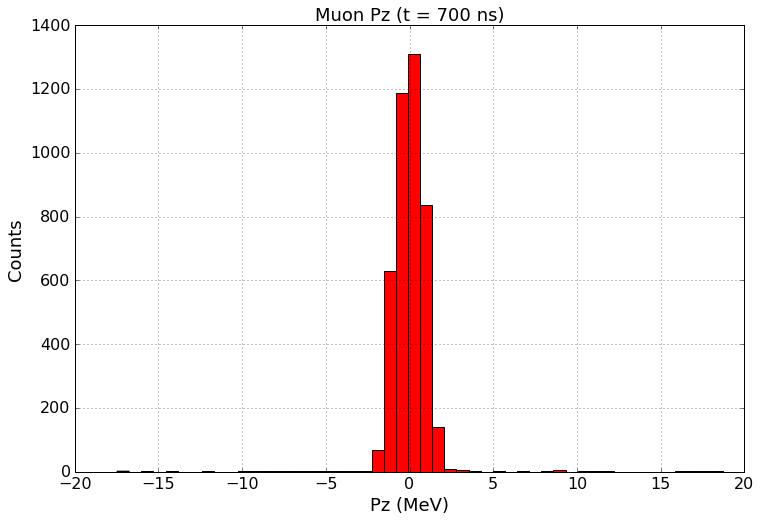

In [25]:
df_ntpart.query('pdg==13 and time>0 and pstop>100').pzstop.hist(bins=50, color='r')
plt.title('Muon Pz (t = 700 ns)')
plt.ylabel('Counts')
plt.xlabel('Pz (MeV)')

In [3]:
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/iso_muons_GA05_stage2_vd_solo.h5')
df_nttvd_solo = store.df_nttvd
df_ntvd_solo = store.df_ntvd
df_ntpart_solo = store.df_ntpart
store.close()

In [4]:
store_xray = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/low_e_ele_0T_v580.h5')
df_xray = store_xray.df_ntpart
store_xray.close()

In [5]:
df_mu = df_ntpart.query('pdg==13 and time>0')[0:20000].reset_index()
#df_mu = df_ntpart.query('pdg==13 and time>0').reset_index()

df_mu.name = 'Muons'
mu2e_plot3d_ptrap(df_mu,
                  'zstop','xstop','ystop', x_range=[3700,17500], y_range = [-1000,1000], z_range=[-1000,1000], save_name=None,
                   df_xray=df_xray, color='pstop', title='Muon position at t=700ns')

binning...
binned


/Users/brianpollack/Coding/Mu2E/mu2e/mu2eplots.py:773: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



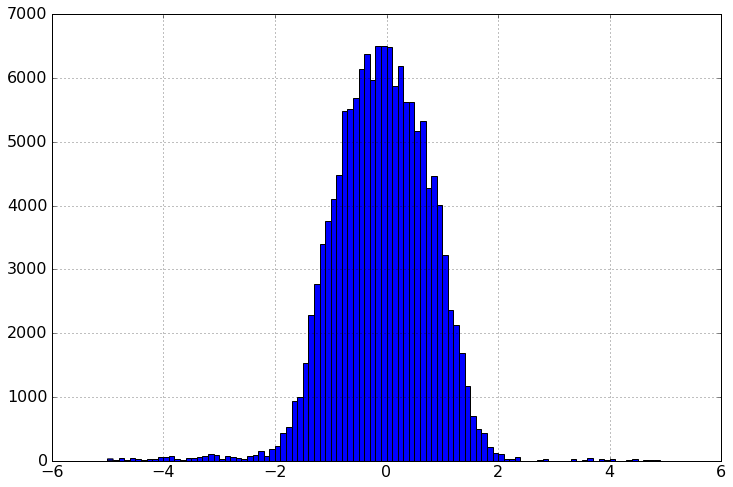

In [60]:
df_mu = df_ntpart.query('pdg==13 and time>0')
df_el = df_ntpart.query('pdg==11')

df_mu.pz.hist(range=[-5,5],bins=100)

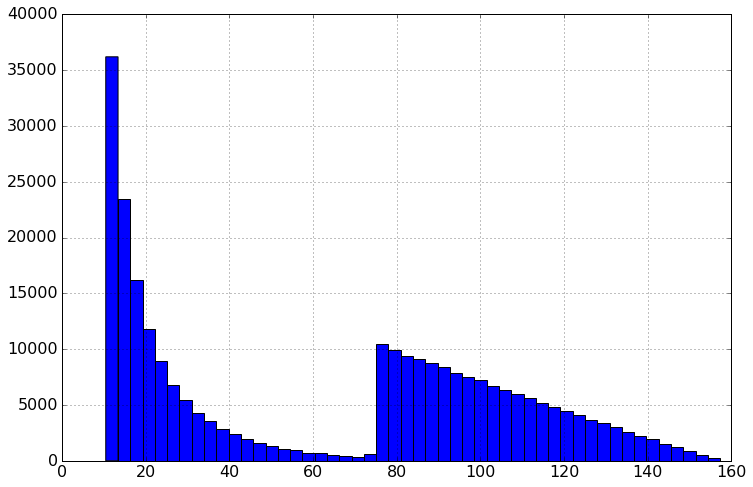

In [61]:
df_el.p.hist(bins=50)

In [ ]:
df_ntvd_ele = df_ntvd.query('pdg==11').reset_index()
df_ntvd_ele.name = 'Electrons'
mu2e_plot3d_ptrap(df_ntvd_ele,
                  'z','x','y', x_range=[3700,17500], y_range = [-1000,1000], z_range=[-1000,1000], save_name=None,
                   df_xray=df_xray, color='p', symbol='x', title='Electrons, p>100 VD hits')

In [64]:
len(df_ntvd_ele.query('pdg==11 and z<11200').runevt.unique())

21

In [22]:
init_mu = len(df_ntpart.query('pdg==13 and time==0'))
ele_100_110 = len(df_ntpart.query('pdg==11 and 100<p<110'))
ele_103_105 = len(df_ntpart.query('pdg==11 and 103.85<p<105.1'))
print init_mu
print ele_100_110, (float(ele_100_110)/init_mu)
print ele_103_105, (float(ele_103_105)/init_mu)

103235
3859 0.0373807332784
466 0.00451397297428


In [6]:
df_nttvd_ele_solo = df_nttvd_solo.query('runevt==133139712 and pdg==11')
df_nttvd_mu_solo = df_nttvd_solo.query('runevt==133139712 and pdg==13')
df_nttvd_ele_solo.name = 'Sneaky Electron'

In [8]:
df_ntvd_ele_solo = df_ntvd.query('runevt==621228021543 and pdg==11')

NameError: name 'df_ntvd' is not defined

In [18]:
df_ntvd.query('runevt==621228021543 and pdg==11')

,evt,trk,sid,pdg,time,x,y,z,px,py,pz,xl,yl,zl,pxl,pyl,pzl,gtime,g4bl_weight,g4bl_time,run,ke,subrun,code,runevt,p
index,,,,,,,,,,,,,,,,,,,,,,,,,,
44439,8021543.0,100004.0,79.0,11.0,1232.412231,-235.180664,-290.699615,12560.327148,-13.852112,-97.414253,-35.144432,-235.180557,-290.699615,-115.747673,-13.852112,-97.414253,-35.144432,0.018627,0.0,0.0,13572220.0,103.972542,122.0,14.0,621228021543,104.482292
44440,8021543.0,100004.0,75.0,11.0,1232.584473,-238.410645,-339.161560,12542.969727,0.448451,-98.402359,-35.118713,-238.410614,-339.161560,133.054993,0.448451,-98.402359,-35.118713,0.019469,0.0,0.0,13572220.0,103.972542,122.0,14.0,621228021543,104.482292
44441,8021543.0,100004.0,74.0,11.0,1236.952637,377.587402,-158.721634,12109.200195,-52.768162,83.421745,-34.247364,377.587311,-158.721634,-133.035004,-52.768162,83.421745,-34.247364,0.040832,0.0,0.0,13572220.0,103.972542,122.0,14.0,621228021543,104.482285
44442,8021543.0,100004.0,77.0,11.0,1237.103027,352.810059,-123.980263,12094.680664,-60.985336,76.637489,-32.869064,352.810120,-123.980263,118.606133,-60.985336,76.637489,-32.869064,0.041573,0.0,0.0,13572220.0,102.799957,122.0,14.0,621228021543,103.309685
44443,8021543.0,100004.0,15.0,11.0,1240.080322,-234.925293,-359.201111,11810.120117,8.911324,-97.529396,-32.886135,-234.925339,-359.201111,0.010000,8.911324,-97.529396,-32.886135,0.056300,0.0,0.0,13572220.0,102.799957,122.0,14.0,621228021543,103.309700
44444,8021543.0,100004.0,23.0,11.0,1244.358276,354.219238,-128.772354,11406.635742,-58.978825,77.914253,-31.905729,354.219269,-128.772354,1231.636108,-58.978825,77.914253,-31.905729,0.077516,0.0,0.0,13572220.0,102.286713,122.0,14.0,621228021543,102.796440
44445,8021543.0,100004.0,23.0,11.0,1247.119751,-232.695801,-296.464508,11149.338867,-8.663546,-97.337608,-31.897356,-232.695801,-296.464508,974.338745,-8.663546,-97.337608,-31.897356,0.091243,0.0,0.0,13572220.0,102.286713,122.0,14.0,621228021543,102.796440
44446,8021543.0,100004.0,23.0,11.0,1251.501465,352.543457,-133.291855,10749.972656,-57.237595,79.159096,-30.135963,352.543457,-133.291855,574.972473,-57.237595,79.159096,-30.135963,0.113095,0.0,0.0,13572220.0,101.717873,122.0,14.0,621228021543,102.227592
44447,8021543.0,100004.0,23.0,11.0,1254.255859,-233.747559,-295.635864,10506.072266,-8.183792,-97.332413,-30.164686,-233.747665,-295.635864,331.072083,-8.183792,-97.332413,-30.164686,0.126863,0.0,0.0,13572220.0,101.717873,122.0,14.0,621228021543,102.227600


In [9]:
g.plot(fig)

In [8]:

g, fig = mu2e_plot3d_ptrap_anim(df_nttvd_ele_solo,'z','x','y',df_xray,
                                 color=True,title='Electrons from trapped muons')

binning...
binned


In [7]:
df_ntvd_ele_solo.name = 'Sneaky Electron'
df_ntvd_ele_solo.sort_values('time', inplace=True)

NameError: name 'df_ntvd_ele_solo' is not defined

In [21]:
df_tmp = df_nttvd.query('runevt==2').sort_values('time')
df_tmp.name='Cosmic'

In [9]:
df_nttvd_solo.name = 'Electron'

In [11]:
mu2e_plot3d_ptrap_traj(df_nttvd_ele_solo,'z','x','y',df_xray=df_xray,
                        title='Electrons from trapped muons')

binning...
binned


/Users/brianpollack/Coding/Mu2E/mu2e/mu2eplots.py:771: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



ValueError: The image parameter must be one of the following: ['jpeg', 'png', 'webp', 'svg']

In [15]:
df_nttvd_mu_test = df_nttvd.query('runevt==38654 and pdg==13')
df_nttvd_mu_test.name = 'Muon'

In [ ]:
df_ntvd_ele.query('p>=100 and z<11090')

In [ ]:
df_ntvd_ele[df_ntvd_ele.z==df_ntvd_ele.z.min()]

In [ ]:
df_nttvd[df_nttvd.runevt==58133139712]

In [ ]:
df_ntvd.query('pdg==11 and z<11800').p.hist()
plt.title('Electrons, Z<11800')
plt.xlabel('p (MeV)')

In [ ]:
df_ntvd.query('p>=100').z.hist()
plt.title('Electrons, p>100')
plt.xlabel('Z (mm)')

In [ ]:
df_nttvd_normal[df_nttvd_normal.sid==1].pz.hist(bins=40)

In [ ]:
df_ntpart.query('pdg==11').p.hist(bins=20)
plt.title('Electron Initial Momentum')
plt.xlabel('p (MeV)')

In [ ]:
df_ntpart.query('pdg==11 and parent_p>75').z.hist(bins=20, )
plt.title('Electron Starting Z (muon p>75)')
plt.xlabel('Z (mm)')

In [ ]:
df_ntvd.query('pdg==11 and parent_p>75').z.hist(bins=20, )
plt.title('Electron Stoping Z (muon p>75)')
plt.xlabel('Z (mm)')

In [ ]:
df_ntpart.columns

In [ ]:
df_ntpart.p.hist(bins=50)
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')
plt.title('Initial Muon Momentum for `ntpart` tree')

In [ ]:
g.save?

In [ ]:
df_nttvd.query('pdg==13').sid.max()

In [ ]:
from mu2e.dataframeprod import g4root_to_df
g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/iso_muons_GA05_stage2_vd2',True,True)

In [ ]:
df_ntpart[df_ntpart.evt==25456]

## Some results

In [ ]:
print 'total number of muons (that survive 700)', len(df_ntpart.query('pdg==13 and time==0'))
print 'total number of electrons (between 700 and 10k)', len(df_ntpart.query('pdg==11'))

In [ ]:
df_ntpart.query('pdg==13 and time==0').pstop.hist()
plt.gca().set_yscale('log')
plt.title('Muon momenta at 700 ns')


In [ ]:
df_ntpart.query('pdg==13 and time==0').zstop.hist()
plt.gca().set_yscale('log')
plt.title('Muon z position at 700 ns')

In [ ]:
df_ntpart.query('pdg==11').p.hist()
plt.title('Electron starting momenta')

In [ ]:
from mu2e.dataframeprod import g4root_to_df

g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/tmp/iso_muons_GA05_stage2_vd1',True,True)
g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/tmp/iso_muons_GA05_stage2_vd2',True,True)

In [ ]:
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/tmp/iso_muons_GA05_stage2_vd1.h5')
df_ntpart1 = store.df_ntpart
store.close()
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/tmp/iso_muons_GA05_stage2_vd2.h5')
df_ntpart2 = store.df_ntpart
store.close()

In [ ]:
df_ntpart1.query('runevt==28139').pstop

In [ ]:
df_ntpart2.query('runevt==28139').pstop

# Bookkeeping for high-stats samples

In [4]:
from mu2e.dataframeprod import g4root_to_df
import tqdm
for i in range(100):
    g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/stage2_80p/iso_muons_GA05_stage2_vd{}'.format(i),True,True,cluster=i)

loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading into hdf5
file finished
loading 

KeyboardInterrupt: 

In [ ]:
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/stage2/iso_muons_GA05_stage2_vd0.h5')
df_nttvd = store.df_nttvd
df_ntvd = store.df_ntvd
df_ntpart = store.df_ntpart
store.close()


In [ ]:
from root_pandas import to_root, read_root
import tqdm
df_nttvd_list = []
for i in tqdm.tqdm_notebook(range(100)):
    input_root = mu2e_ext_path+'datafiles/G4ParticleSim/stage2_110p/iso_muons_GA05_stage2_vd{}.root'.format(i)
    output_root = mu2e_ext_path+'datafiles/G4ParticleSim/stage2_80p/iso_muons_GA05_stage2_vd{}_skim.root'.format(i)
    df_ntpart = read_root(input_root, 'ntpart')
    df_nttvd = read_root(input_root, 'nttvd')
    df_ntvd = read_root(input_root, 'ntvd')
    
    good_runevt = df_ntpart.query('pdg==11 and p>75').runevt.unique()
    df_ntpart = df_ntpart[df_ntpart.runevt.isin(good_runevt)]
    df_ntvd = df_ntvd[df_ntvd.runevt.isin(good_runevt)]
    df_nttvd = df_nttvd[df_nttvd.runevt.isin(good_runevt)]
    df_ntvd.to_root(output_root, tree_key='ntvd', mode = 'w')
    df_nttvd.to_root(output_root, tree_key='nttvd', mode = 'a')
    df_ntpart.to_root(output_root, tree_key='ntpart', mode = 'a')


In [ ]:
df_nttvd = pd.concat(df_nttvd_list, ignore_index=True)


In [ ]:
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/stage2/iso_muons_GA05_stage2_vd_combo.h5')

In [ ]:
import root_pandas

In [ ]:
from mu2e.dataframeprod import g4root_to_df
from mu2e import mu2e_ext_path
df_ntpart, df_nttvd, df_ntvd = g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/stage2/iso_muons_GA05_stage2_vd_combo',tree_prefix='')

In [ ]:
input_root_solo = mu2e_ext_path+'datafiles/G4ParticleSim/iso_muons_GA05_stage2_vd_solo'
g4root_to_df(input_root_solo, do_basic_modifications=True, make_pickle=True)

In [ ]:
#store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/z13k_muons_extmat_GA05.h5')
store = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/iso_muons_GA05_stage2_vd2.h5')
df_nttvd = store.df_nttvd
df_ntvd = store.df_ntvd
df_ntpart = store.df_ntpart
store.close()
store_xray = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/low_e_ele_0T_v580.h5')
df_xray = store_xray.df_ntpart
store_xray.close()
#store2 = pd.HDFStore(mu2e_ext_path+'datafiles/G4ParticleSim/z13k_muons_nomat_GA05.h5')
#df_nttvd2 = store2.df_nttvd
#df_ntpart2 = store2.df_ntpart
#store2.close()

In [5]:
from root_pandas import to_root

In [31]:
from mu2e.dataframeprod import g4root_to_df_skim_and_combo
g4root_to_df_skim_and_combo(mu2e_ext_path+'datafiles/G4ParticleSim/stage2_110p_5k/iso_muons_GA05_stage2_vd', 100)

  5%|▌         | 5/100 [00:06<02:03,  1.30s/it]


KeyboardInterrupt: 

In [2]:
_, df_nttvd, _ = g4root_to_df(mu2e_ext_path+'datafiles/G4ParticleSim/traps_vd', trees=['tvd'], do_basic_modifications=True)

In [3]:
df_tmp = df_nttvd.query('runevt==1 and pdg==13').sort_values('time')
df_tmp.name='Cosmic'

In [5]:
df_tmp

,evt,trk,sid,pdg,time,x,y,z,px,py,pz,gtime,code,g4bl_weight,g4bl_time,run,ke,subrun,runevt,p
0,1.0,1.0,1.0,13.0,0.043619,-92.930176,19986.955078,12606.946289,-0.014990,-1499.996948,0.017701,0.003065,31.0,0.0,0.0,1.0,1398.055176,0.0,1,1499.996948
1,1.0,1.0,2.0,13.0,2.211785,-92.936523,19338.562500,12606.954102,0.647712,-1499.894043,-0.511345,0.155411,31.0,0.0,0.0,1.0,1397.952759,0.0,1,1499.894287
2,1.0,1.0,3.0,13.0,2.211785,-92.936523,19338.562500,12606.954102,0.647712,-1499.894043,-0.511345,0.155411,31.0,0.0,0.0,1.0,1397.952759,0.0,1,1499.894287
3,1.0,1.0,4.0,13.0,4.148641,-92.650391,18759.343750,12606.629883,0.343289,-1499.784424,-0.779720,0.291516,31.0,0.0,0.0,1.0,1397.843506,0.0,1,1499.784546
4,1.0,1.0,5.0,13.0,4.148641,-92.650391,18759.343750,12606.629883,0.343289,-1499.784424,-0.779720,0.291516,31.0,0.0,0.0,1.0,1397.843506,0.0,1,1499.784546
5,1.0,1.0,6.0,13.0,5.472019,-92.616943,18363.587891,12606.370117,-0.216775,-1499.720947,-1.219483,0.384517,31.0,0.0,0.0,1.0,1397.780396,0.0,1,1499.721436
6,1.0,1.0,7.0,13.0,6.244253,-92.650391,18132.650391,12606.182617,-0.094073,-1499.683472,-0.985393,0.438788,31.0,0.0,0.0,1.0,1397.742920,0.0,1,1499.683838
7,1.0,1.0,8.0,13.0,7.005538,-92.670898,17904.986328,12606.041992,-0.361329,-1499.647583,-0.587496,0.492291,31.0,0.0,0.0,1.0,1397.706909,0.0,1,1499.647705
8,1.0,1.0,9.0,13.0,8.316054,-92.804443,17513.076172,12605.917969,-0.829766,-1499.555542,-0.493813,0.584399,31.0,0.0,0.0,1.0,1397.615234,0.0,1,1499.555908
9,1.0,1.0,10.0,13.0,9.205383,-92.943848,17247.121094,12605.865234,-0.410935,-1499.510132,-0.452447,0.646906,31.0,0.0,0.0,1.0,1397.569824,0.0,1,1499.510376


In [9]:
mu2e_plot3d_ptrap_traj(df_tmp,'z','x','y',df_xray=df_xray, z_range=(-1000, 8000),
                        title='Cosmic muons')

In [77]:
df_nttvd.time.max()

89.288307